In [1]:
import matplotlib.pyplot as plt
import numpy as np
from torch import nn
import torch.nn.functional as F
import torch
from torch import optim
import random
import time
from utils import load_1d_data
from utils import load_2d_data
from utils import draw
from utils import table_draw


In [2]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        # The decoder
        self.t_conv1 = nn.ConvTranspose2d(1, 16, 2, stride=2)
        self.t_conv2 = nn.ConvTranspose2d(16, 1, 2, stride=2)

        return

    def forward(self, x):
        x = F.relu(self.t_conv1(x))
        x = F.sigmoid(self.t_conv2(x))

        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv1 = nn.Conv2d(1, 6, 3, stride=(1, 1))
        self.conv2 = nn.Conv2d(6, 16, 3, stride=(1, 1))

        self.pool = nn.MaxPool2d(2, 2)
        
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 32)
        self.fc3 = nn.Linear(32, 2)

        self.sm = nn.Softmax()

        self.criterion = nn.NLLLoss()

        return

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))

        x = self.pool(F.relu(self.conv2(x)))

        x = x.view(-1, self.num_flat_features(x))   # -1 represents the batch dimension
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.sm(self.fc3(x))
        return x

    def num_flat_features(self, x):
        size = x.size()[1:]
        num_features = 1
        for s in size:
            num_features *= s
        return num_features

class GAN(nn.Module):
    def __init__(self):
        super(GAN, self).__init__()
        self.generator = Generator()
        self.discriminator = Discriminator()

        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    def forward(self, x):
        x = self.generator.forward(x)

        return x

    def noise(self, num_samples):
        return torch.rand(num_samples, 1, 7, 7, device=(self.device))

    def g_loss(self, d_out):
        loss = torch.mean(torch.log(1 - d_out[:, 1]))

        return loss

    def train(self, train_set, batch_size, num_epoche, g_eta, g_momentum, d_eta, d_momentum, show=False):
        train_set = train_set.to(self.device)
        self.to(self.device)
        print("trainning on " + str(self.device))

        labels = torch.cat((torch.zeros(batch_size, dtype=torch.long), torch.ones(batch_size, dtype=torch.long)), 0)
        labels = labels.to(self.device)

        g_optimizer = optim.Adam(self.generator.parameters(), lr=g_eta)
        d_optimizer = optim.Adam(self.discriminator.parameters(), lr=d_eta)
        num_set = train_set.size()[0]

        for epoch in range(num_epoche):
            tic = time.time()

            perm = perm = torch.randperm(num_set)
            for j in range(0, num_set, batch_size):
                indices = perm[j:j + batch_size]

                # optimize generator
                g_optimizer.zero_grad()

                noise = self.noise(batch_size)

                g_out = self.generator(noise)
                d_out = self.discriminator(g_out)

                g_loss = self.g_loss(d_out)
                g_loss.backward()
                g_optimizer.step()

                # optimize discriminator
                d_optimizer.zero_grad()

                fake = g_out.detach()
                real = train_set[indices]
                batch = torch.cat((fake, real), 0)

                d_out = self.discriminator(batch)
                d_loss = self.discriminator.criterion(d_out, labels)
                d_loss.backward()
                d_optimizer.step()

            elapse = time.time() - tic
            print('epoch ' + str(epoch) + ' finished!')
            print('time usage: ' + str(elapse))

            if show is True:
                with torch.no_grad():
                    x = self.forward(self.noise(9))
                x = x.to(torch.device('cpu'))
                table_draw(x, 3, 3)
        
        self.to(torch.device('cpu'))


In [3]:
train_set, train_label, valid_set, valid_label, test_set, test_label = load_2d_data(50000, 0, 0)


trainning on cuda:0
epoch 0 finished!
time usage: 23.368780851364136
epoch 1 finished!
time usage: 23.693796396255493
epoch 2 finished!
time usage: 23.09207582473755
epoch 3 finished!
time usage: 23.019638061523438
epoch 4 finished!
time usage: 23.137784242630005
epoch 5 finished!
time usage: 22.93402647972107
epoch 6 finished!
time usage: 23.629332304000854
epoch 7 finished!
time usage: 23.123546838760376
epoch 8 finished!
time usage: 23.419641256332397
epoch 9 finished!
time usage: 22.952359676361084
epoch 10 finished!
time usage: 22.830573320388794
epoch 11 finished!
time usage: 23.05055022239685
epoch 12 finished!
time usage: 23.279231071472168
epoch 13 finished!
time usage: 22.950035095214844
epoch 14 finished!
time usage: 23.04035997390747
epoch 15 finished!
time usage: 23.198604822158813
epoch 16 finished!
time usage: 23.02758240699768
epoch 17 finished!
time usage: 23.01176881790161
epoch 18 finished!
time usage: 23.322898626327515
epoch 19 finished!
time usage: 23.669249057769

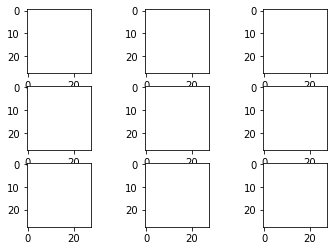

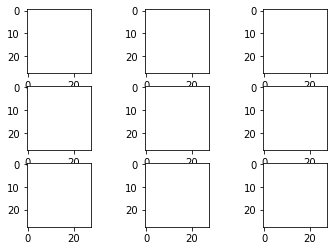

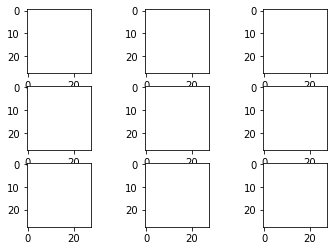

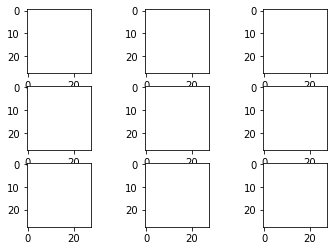

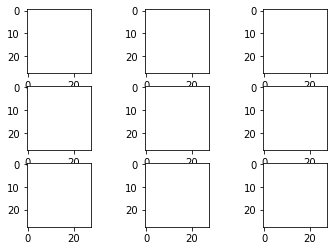

...

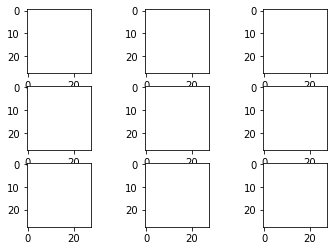

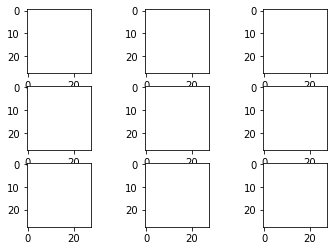

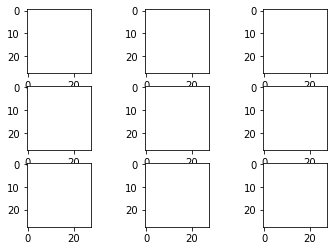

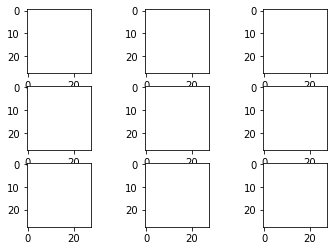

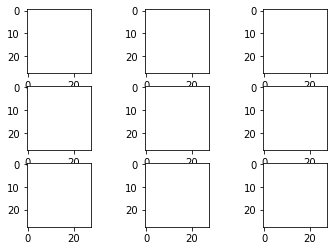

In [4]:
net = GAN()
net.train(train_set, 10, 30, 0.1, 0.1, 0.1, 0.1, True)


In [5]:
noise = net.noise(20).to(torch.device('cpu'))
g_out = net.generator(noise)

In [6]:
g_out.size()

torch.Size([20, 1, 28, 28])

In [7]:
print(g_out)

tensor([[[[nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          ...,
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan]]],


        [[[nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          ...,
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan]]],


        [[[nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          ...,
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan],
          [nan, nan, nan,  ..., nan, nan, nan]]],


        ...,


        [[[nan, nan, nan,  ..., nan, nan, nan],
          [nan, 

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from torch import nn
import torch.nn.functional as F
import torch
from torch import optim
import random
import time
from utils import load_1d_data
from utils import load_2d_data
from utils import draw
from utils import table_draw


In [9]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        # The decoder
        self.t_conv1 = nn.ConvTranspose2d(1, 16, 2, stride=2)
        self.t_conv2 = nn.ConvTranspose2d(16, 1, 2, stride=2)

        return

    def forward(self, x):
        x = F.relu(self.t_conv1(x))
        x = F.sigmoid(self.t_conv2(x))

        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv1 = nn.Conv2d(1, 6, 3, stride=(1, 1))
        self.conv2 = nn.Conv2d(6, 16, 3, stride=(1, 1))

        self.pool = nn.MaxPool2d(2, 2)
        
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 32)
        self.fc3 = nn.Linear(32, 2)

        self.sm = nn.Softmax()

        self.criterion = nn.NLLLoss()

        return

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))

        x = self.pool(F.relu(self.conv2(x)))

        x = x.view(-1, self.num_flat_features(x))   # -1 represents the batch dimension
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.sm(self.fc3(x))
        return x

    def num_flat_features(self, x):
        size = x.size()[1:]
        num_features = 1
        for s in size:
            num_features *= s
        return num_features

class GAN(nn.Module):
    def __init__(self):
        super(GAN, self).__init__()
        self.generator = Generator()
        self.discriminator = Discriminator()

        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    def forward(self, x):
        x = self.generator.forward(x)

        return x

    def noise(self, num_samples):
        return torch.rand(num_samples, 1, 7, 7, device=(self.device))

    def g_loss(self, d_out):
        loss = torch.mean(torch.log(1 - d_out[:, 1]))

        return loss

    def train(self, train_set, batch_size, num_epoche, g_eta, g_momentum, d_eta, d_momentum, show=False):
        train_set = train_set.to(self.device)
        self.to(self.device)
        print("trainning on " + str(self.device))

        labels = torch.cat((torch.zeros(batch_size, dtype=torch.long), torch.ones(batch_size, dtype=torch.long)), 0)
        labels = labels.to(self.device)

        g_optimizer = optim.SGD(self.generator.parameters(), lr=g_eta, momentum=g_momentum)
        d_optimizer = optim.SGD(self.discriminator.parameters(), lr=d_eta, momentum=d_momentum)
        num_set = train_set.size()[0]

        for epoch in range(num_epoche):
            tic = time.time()

            perm = perm = torch.randperm(num_set)
            for j in range(0, num_set, batch_size):
                indices = perm[j:j + batch_size]

                # optimize generator
                g_optimizer.zero_grad()

                noise = self.noise(batch_size)

                g_out = self.generator(noise)
                d_out = self.discriminator(g_out)

                g_loss = self.g_loss(d_out)
                g_loss.backward()
                g_optimizer.step()

                # optimize discriminator
                d_optimizer.zero_grad()

                fake = g_out.detach()
                real = train_set[indices]
                batch = torch.cat((fake, real), 0)

                d_out = self.discriminator(batch)
                d_loss = self.discriminator.criterion(d_out, labels)
                d_loss.backward()
                d_optimizer.step()

            elapse = time.time() - tic
            print('epoch ' + str(epoch) + ' finished!')
            print('time usage: ' + str(elapse))

            if show is True:
                with torch.no_grad():
                    x = self.forward(self.noise(9))
                x = x.to(torch.device('cpu'))
                table_draw(x, 3, 3)
        
        self.to(torch.device('cpu'))


In [10]:
train_set, train_label, valid_set, valid_label, test_set, test_label = load_2d_data(50000, 0, 0)


In [11]:
net = GAN()
net.train(train_set, 10, 30, 0.1, 0.1, 0.1, 0.1, True)


trainning on cuda:0
epoch 0 finished!
time usage: 19.335061073303223
epoch 1 finished!
time usage: 19.01949429512024


KeyboardInterrupt: 

In [12]:
import matplotlib.pyplot as plt
import numpy as np
from torch import nn
import torch.nn.functional as F
import torch
from torch import optim
import random
import time
from utils import load_1d_data
from utils import load_2d_data
from utils import draw
from utils import table_draw


In [13]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        # The decoder
        self.t_conv1 = nn.ConvTranspose2d(1, 16, 2, stride=2)
        self.t_conv2 = nn.ConvTranspose2d(16, 1, 2, stride=2)

        return

    def forward(self, x):
        x = F.relu(self.t_conv1(x))
        x = F.sigmoid(self.t_conv2(x))

        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv1 = nn.Conv2d(1, 6, 3, stride=(1, 1))
        self.conv2 = nn.Conv2d(6, 16, 3, stride=(1, 1))

        self.pool = nn.MaxPool2d(2, 2)
        
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 32)
        self.fc3 = nn.Linear(32, 2)

        self.sm = nn.Softmax()

        self.criterion = nn.NLLLoss()

        return

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))

        x = self.pool(F.relu(self.conv2(x)))

        x = x.view(-1, self.num_flat_features(x))   # -1 represents the batch dimension
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.sm(self.fc3(x))
        return x

    def num_flat_features(self, x):
        size = x.size()[1:]
        num_features = 1
        for s in size:
            num_features *= s
        return num_features

class GAN(nn.Module):
    def __init__(self):
        super(GAN, self).__init__()
        self.generator = Generator()
        self.discriminator = Discriminator()

        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    def forward(self, x):
        x = self.generator.forward(x)

        return x

    def noise(self, num_samples):
        return torch.rand(num_samples, 1, 7, 7, device=(self.device))

    def g_loss(self, d_out):
        loss = torch.mean(torch.log(1 - d_out[:, 1]))

        return loss

    def train(self, train_set, batch_size, num_epoche, g_eta, g_momentum, d_eta, d_momentum, show=False):
        train_set = train_set.to(self.device)
        self.to(self.device)
        print("trainning on " + str(self.device))

        labels = torch.cat((torch.zeros(batch_size, dtype=torch.long), torch.ones(batch_size, dtype=torch.long)), 0)
        labels = labels.to(self.device)

        g_optimizer = optim.SGD(self.generator.parameters(), lr=g_eta, momentum=g_momentum)
        d_optimizer = optim.SGD(self.discriminator.parameters(), lr=d_eta, momentum=d_momentum)
        num_set = train_set.size()[0]

        for epoch in range(num_epoche):
            tic = time.time()

            perm = perm = torch.randperm(num_set)
            for j in range(0, num_set, batch_size):
                indices = perm[j:j + batch_size]

                # optimize generator
                g_optimizer.zero_grad()

                noise = self.noise(batch_size)

                g_out = self.generator(noise)
                d_out = self.discriminator(g_out)

                g_loss = self.g_loss(d_out)
                g_loss.backward()
                g_optimizer.step()

                # optimize discriminator
                d_optimizer.zero_grad()

                fake = g_out.detach()
                real = train_set[indices]
                batch = torch.cat((fake, real), 0)

                d_out = self.discriminator(batch)
                d_loss = self.discriminator.criterion(d_out, labels)
                d_loss.backward()
                d_optimizer.step()

            elapse = time.time() - tic
            print('epoch ' + str(epoch) + ' finished!')
            print('time usage: ' + str(elapse))

            if show is True:
                with torch.no_grad():
                    x = self.forward(self.noise(9))
                x = x.to(torch.device('cpu'))
                table_draw(x, 3, 3)
        
        self.to(torch.device('cpu'))


In [14]:
train_set, train_label, valid_set, valid_label, test_set, test_label = load_2d_data(50000, 0, 0)


trainning on cuda:0
epoch 0 finished!
time usage: 19.22398591041565
epoch 1 finished!
time usage: 19.065876245498657
epoch 2 finished!
time usage: 19.379921913146973
epoch 3 finished!
time usage: 19.07268738746643
epoch 4 finished!
time usage: 19.120757341384888


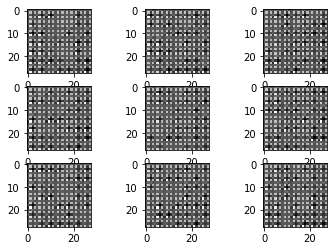

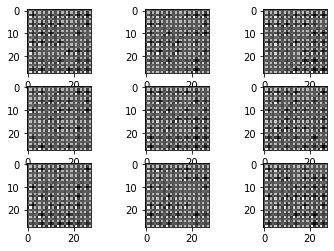

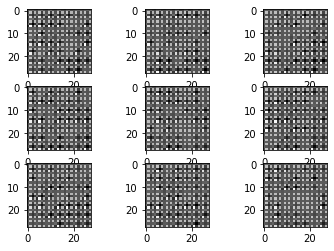

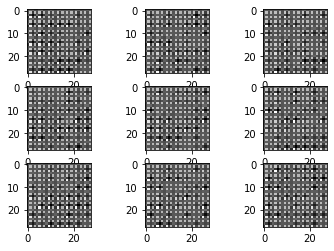

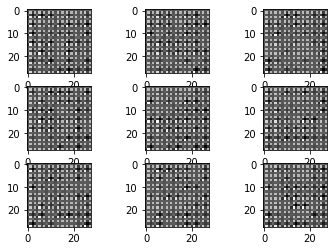

In [15]:
net = GAN()
net.train(train_set, 10, 5, 0.1, 0.1, 0.1, 0.1, True)


trainning on cuda:0
epoch 0 finished!
time usage: 19.07905077934265
epoch 1 finished!
time usage: 19.38792586326599
epoch 2 finished!
time usage: 19.250616788864136
epoch 3 finished!
time usage: 19.337443828582764
epoch 4 finished!
time usage: 19.492610454559326
epoch 5 finished!
time usage: 19.442692518234253
epoch 6 finished!
time usage: 19.11710214614868
epoch 7 finished!
time usage: 19.088484048843384
epoch 8 finished!
time usage: 19.37214493751526
epoch 9 finished!
time usage: 19.378761291503906
epoch 10 finished!
time usage: 19.02062726020813
epoch 11 finished!
time usage: 19.312379837036133
epoch 12 finished!
time usage: 18.9748432636261
epoch 13 finished!
time usage: 18.741546869277954
epoch 14 finished!
time usage: 19.011831283569336
epoch 15 finished!
time usage: 19.26898455619812
epoch 16 finished!
time usage: 19.275994062423706
epoch 17 finished!
time usage: 19.32221245765686
epoch 18 finished!
time usage: 19.748952865600586
epoch 19 finished!
time usage: 19.51303505897522


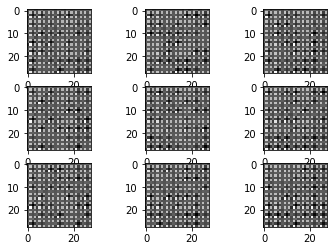

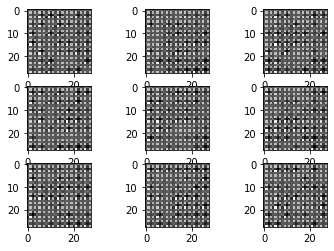

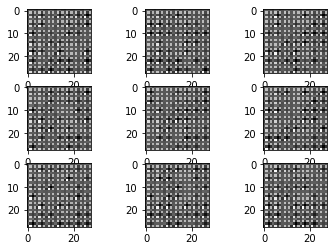

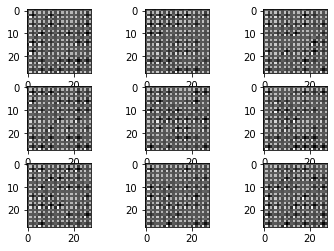

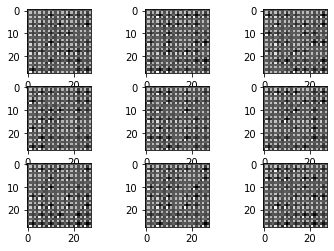

...

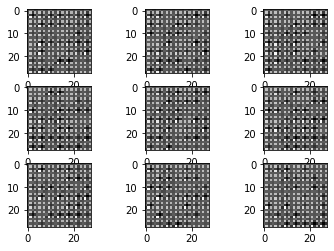

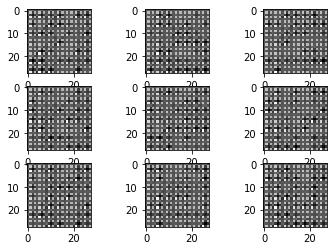

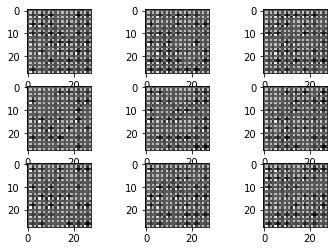

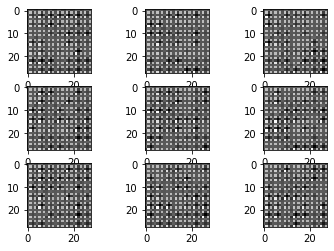

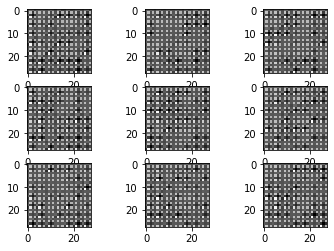

In [16]:
net.train(train_set, 10, 30, 0.1, 0.1, 0.1, 0.1, True)


In [17]:
import matplotlib.pyplot as plt
import numpy as np
from torch import nn
import torch.nn.functional as F
import torch
from torch import optim
import random
import time
from utils import load_1d_data
from utils import load_2d_data
from utils import draw
from utils import table_draw


In [18]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        # The decoder
        self.t_conv1 = nn.ConvTranspose2d(1, 16, 2, stride=2)
        self.t_conv2 = nn.ConvTranspose2d(16, 1, 2, stride=2)

        return

    def forward(self, x):
        x = F.relu(self.t_conv1(x))
        x = F.sigmoid(self.t_conv2(x))

        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.conv1 = nn.Conv2d(1, 6, 3, stride=(1, 1))
        self.conv2 = nn.Conv2d(6, 16, 3, stride=(1, 1))

        self.pool = nn.MaxPool2d(2, 2)
        
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 32)
        self.fc3 = nn.Linear(32, 2)

        self.sm = nn.Softmax()

        self.criterion = nn.NLLLoss()

        return

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))

        x = self.pool(F.relu(self.conv2(x)))

        x = x.view(-1, self.num_flat_features(x))   # -1 represents the batch dimension
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.sm(self.fc3(x))
        return x

    def num_flat_features(self, x):
        size = x.size()[1:]
        num_features = 1
        for s in size:
            num_features *= s
        return num_features

class GAN(nn.Module):
    def __init__(self):
        super(GAN, self).__init__()
        self.generator = Generator()
        self.discriminator = Discriminator()

        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    def forward(self, x):
        x = self.generator.forward(x)

        return x

    def noise(self, num_samples):
        return torch.rand(num_samples, 1, 7, 7, device=(self.device))

    def g_loss(self, d_out):
        loss = torch.mean(torch.log(1 - d_out[:, 1]))

        return loss

    def train(self, train_set, batch_size, num_epoche, g_eta, g_momentum, d_eta, d_momentum, show=False):
        train_set = train_set.to(self.device)
        self.to(self.device)
        print("trainning on " + str(self.device))

        labels = torch.cat((torch.zeros(batch_size, dtype=torch.long), torch.ones(batch_size, dtype=torch.long)), 0)
        labels = labels.to(self.device)

        g_optimizer = optim.SGD(self.generator.parameters(), lr=g_eta, momentum=g_momentum)
        d_optimizer = optim.SGD(self.discriminator.parameters(), lr=d_eta, momentum=d_momentum)
        num_set = train_set.size()[0]

        for epoch in range(num_epoche):
            tic = time.time()

            perm = perm = torch.randperm(num_set)
            for j in range(0, num_set, batch_size):
                indices = perm[j:j + batch_size]

                # optimize generator
                g_optimizer.zero_grad()

                noise = self.noise(batch_size)

                g_out = self.generator(noise)
                d_out = self.discriminator(g_out)

                g_loss = self.g_loss(d_out)
                g_loss.backward()
                g_optimizer.step()

                # optimize discriminator
                d_optimizer.zero_grad()

                fake = g_out.detach()
                real = train_set[indices]
                batch = torch.cat((fake, real), 0)

                d_out = self.discriminator(batch)
                d_loss = self.discriminator.criterion(d_out, labels)
                d_loss.backward()
                d_optimizer.step()

            elapse = time.time() - tic
            print('epoch ' + str(epoch) + ' finished!')
            print('time usage: ' + str(elapse))

            if show is True:
                with torch.no_grad():
                    x = self.forward(self.noise(9))
                x = x.to(torch.device('cpu'))
                table_draw(x, 3, 3)
        
        self.to(torch.device('cpu'))


In [19]:
train_set, train_label, valid_set, valid_label, test_set, test_label = load_2d_data(50000, 0, 0)


trainning on cuda:0
epoch 0 finished!
time usage: 19.345179319381714
epoch 1 finished!
time usage: 19.407958030700684
epoch 2 finished!
time usage: 19.386021614074707
epoch 3 finished!
time usage: 19.615278959274292
epoch 4 finished!
time usage: 19.067063570022583
epoch 5 finished!
time usage: 19.214199542999268
epoch 6 finished!
time usage: 19.283722162246704
epoch 7 finished!
time usage: 19.218580961227417
epoch 8 finished!
time usage: 19.216890811920166
epoch 9 finished!
time usage: 19.38669514656067
epoch 10 finished!
time usage: 19.38567352294922
epoch 11 finished!
time usage: 19.181124925613403
epoch 12 finished!
time usage: 18.884625911712646
epoch 13 finished!
time usage: 19.45933175086975
epoch 14 finished!
time usage: 19.515013217926025
epoch 15 finished!
time usage: 19.221988439559937
epoch 16 finished!
time usage: 19.4989070892334
epoch 17 finished!
time usage: 19.35776448249817
epoch 18 finished!
time usage: 18.974640130996704
epoch 19 finished!
time usage: 19.310851812362

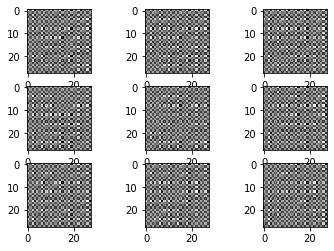

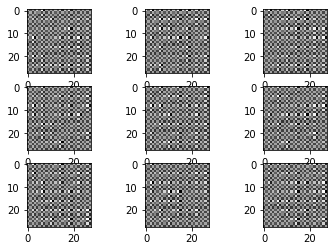

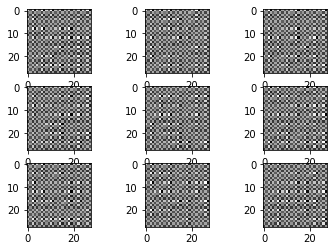

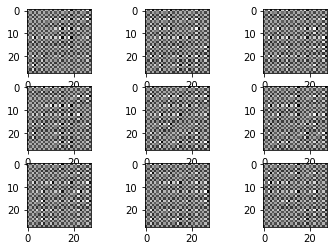

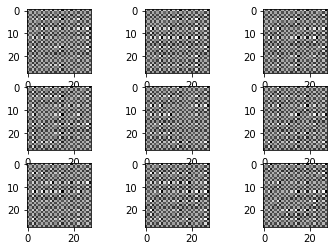

...

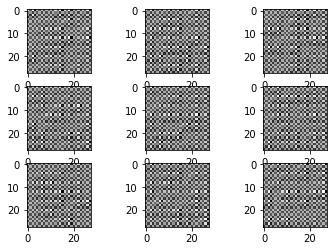

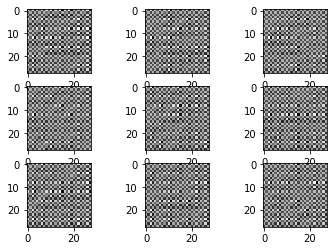

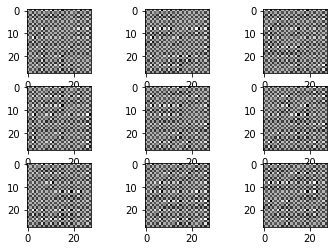

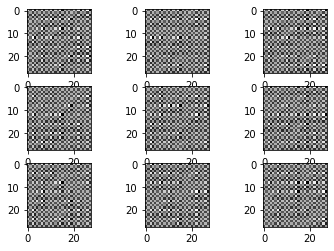

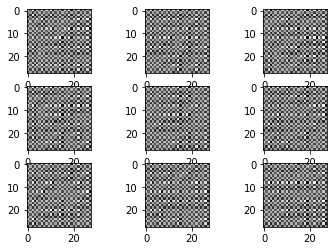

In [20]:
net = GAN()
net.train(train_set, 10, 30, 0.1, 0.1, 0.1, 0.1, True)


trainning on cuda:0
epoch 0 finished!
time usage: 19.429322481155396
epoch 1 finished!
time usage: 19.12993097305298
epoch 2 finished!
time usage: 19.345155715942383
epoch 3 finished!
time usage: 19.450156688690186
epoch 4 finished!
time usage: 19.072783946990967
epoch 5 finished!
time usage: 18.909857273101807
epoch 6 finished!
time usage: 19.144166946411133
epoch 7 finished!
time usage: 19.207498788833618
epoch 8 finished!
time usage: 18.971782684326172
epoch 9 finished!
time usage: 18.990463495254517
epoch 10 finished!
time usage: 19.019877433776855
epoch 11 finished!
time usage: 19.265026807785034
epoch 12 finished!
time usage: 19.35055422782898
epoch 13 finished!
time usage: 19.126965284347534
epoch 14 finished!
time usage: 18.554043531417847
epoch 15 finished!
time usage: 19.560633897781372
epoch 16 finished!
time usage: 19.387000560760498
epoch 17 finished!
time usage: 19.367005825042725
epoch 18 finished!
time usage: 19.26426100730896
epoch 19 finished!
time usage: 19.430445909

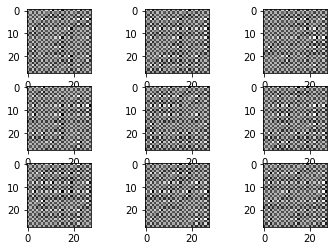

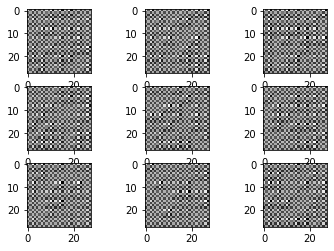

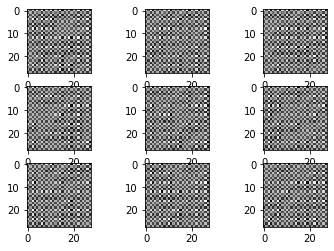

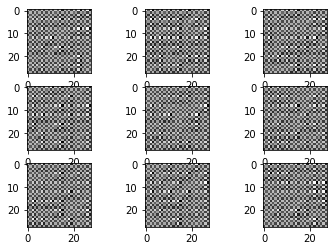

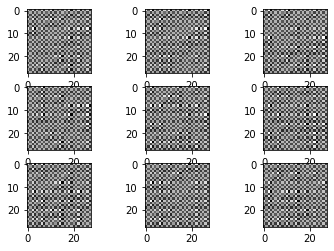

...

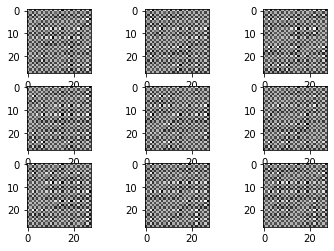

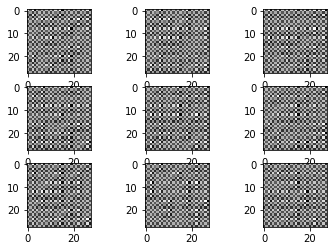

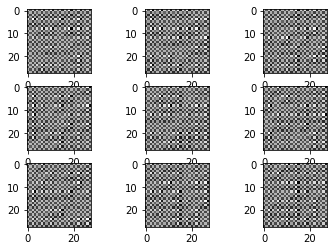

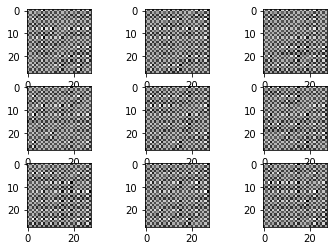

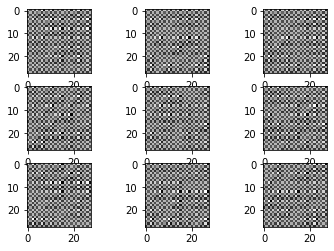

In [21]:
net.train(train_set, 10, 30, 0.1, 0.1, 0.1, 0.1, True)


trainning on cuda:0
epoch 0 finished!
time usage: 19.407893419265747
epoch 1 finished!
time usage: 19.409581899642944
epoch 2 finished!
time usage: 19.070008993148804
epoch 3 finished!
time usage: 18.893362522125244
epoch 4 finished!
time usage: 19.250406503677368
epoch 5 finished!
time usage: 19.0952787399292
epoch 6 finished!
time usage: 19.485785484313965
epoch 7 finished!
time usage: 19.335778951644897
epoch 8 finished!
time usage: 19.320815324783325
epoch 9 finished!
time usage: 19.25055456161499
epoch 10 finished!
time usage: 18.970895528793335
epoch 11 finished!
time usage: 19.57567548751831
epoch 12 finished!
time usage: 19.287339448928833
epoch 13 finished!
time usage: 19.15207529067993
epoch 14 finished!
time usage: 19.113123416900635
epoch 15 finished!
time usage: 19.36842703819275
epoch 16 finished!
time usage: 19.05785059928894
epoch 17 finished!
time usage: 19.33868145942688
epoch 18 finished!
time usage: 19.14941906929016
epoch 19 finished!
time usage: 19.39750361442566


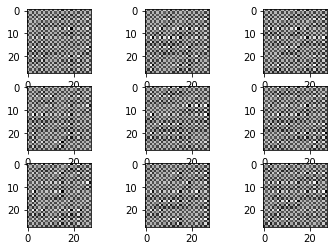

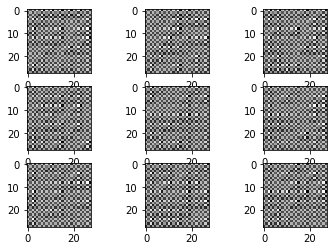

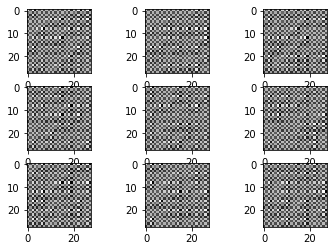

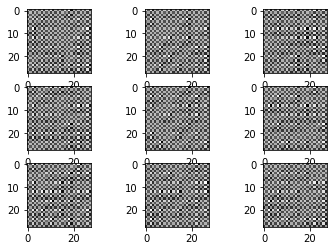

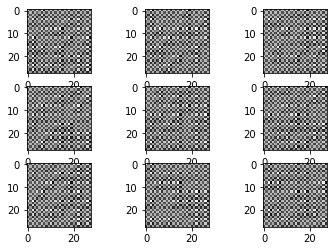

...

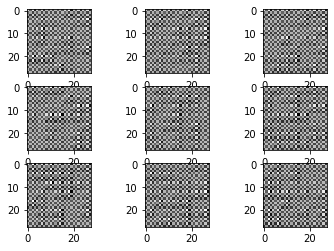

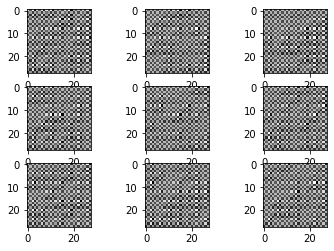

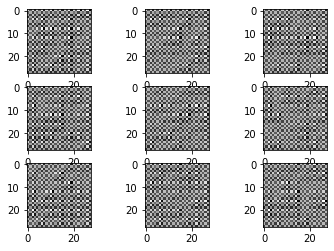

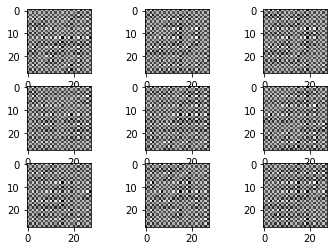

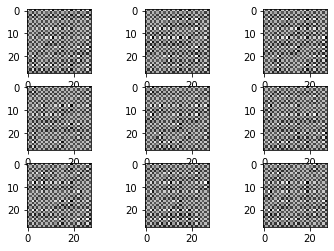

In [22]:
net.train(train_set, 10, 30, 0.1, 0.1, 0.1, 0.1, True)
